In [41]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torchvision.utils as vutils
from torch import nn
from src.model.architectures import (
    GANGenerator,
    GANDiscriminator,
    DCGANGenerator,
    DCGANDiscriminator,
    ConditionalDCGANGenerator,
    ConditionalDCGANDiscriminator,
)
from src.model.gan import GANModel, ConditionalGANModel
from src.utils import DS_ROOT, NOW, ROOT

RESULTS_DIR = ROOT / "results"
DEVICE = "cuda"

LATENT_DIM = 100

In [290]:
ckpts = {
    "MNIST": {
        "gan": RESULTS_DIR / "MNIST/gan/21-09-2023_11:44:29" / "checkpoints/last.pt",
        "dcgan": RESULTS_DIR / "MNIST/dcgan/21-09-2023_12:04:15" / "checkpoints/last.pt",
        "conditional_dcgan": RESULTS_DIR / "MNIST/conditional_dcgan/21-09-2023_13:49:13" / "checkpoints/last.pt",
    },
    "CelebA":{
        "gan": RESULTS_DIR / "CelebA/gan/21-09-2023_15:52:44" / "checkpoints/last.pt",
        "dcgan": RESULTS_DIR / "CelebA/dcgan/21-09-2023_15:08:58" / "checkpoints/last.pt",
    }
}

models = {
    "MNIST": {
        "gan": GANModel(GANGenerator(LATENT_DIM, (1, 28, 28)), GANDiscriminator((1, 28, 28))),
        "dcgan": GANModel(DCGANGenerator(LATENT_DIM, 64, 1), DCGANDiscriminator(1, 64, (1, 64, 64))),
        "conditional_dcgan": ConditionalGANModel(
            ConditionalDCGANGenerator(10, LATENT_DIM, 64, 1), 
            ConditionalDCGANDiscriminator(10, 1, 64, (1, 64, 64))),
    },
    "CelebA": {
        "gan": GANModel(GANGenerator(LATENT_DIM, (3, 64, 64)), GANDiscriminator((3, 64, 64))),
        "dcgan": GANModel(DCGANGenerator(LATENT_DIM, 64, 3), DCGANDiscriminator(3, 64, (3, 64, 64))),
    }
    
}

In [291]:
def load_ckpt(dataset, gan_type):
    ckpt = torch.load(ckpts[dataset][gan_type], map_location=DEVICE)
    return ckpt['module']['model']

def load_model(dataset, gan_type):
    ckpt = load_ckpt(dataset, gan_type)
    model = models[dataset][gan_type]
    model.load_state_dict(ckpt)
    return model.to(DEVICE)

def plot_images(images, ncol=20, filepath=None):
    nrow = images.shape[0] // ncol
    plt.figure(figsize=(ncol*1.8, nrow*1.8))
    plt.subplot(1, 2, 1)
    plt.axis("off")
    plt.imshow(vutils.make_grid(images, nrow=ncol, padding=2, normalize=True).cpu().permute(1,2, 0))
    if filepath is not None:
        plt.savefig(filepath, bbox_inches="tight")

def linear_interpolation_examples(model, latent_idxs: list[int], filepath, n):
    all_images = []
    _z = torch.randn(1, LATENT_DIM, device=DEVICE).repeat(n, 1)
    for latent_idx in latent_idxs:
        # z = _z.clone()
        z = torch.randn(1, LATENT_DIM, device=DEVICE).repeat(n, 1)
        linear_interp = torch.linspace(-3.5, 3.5, n, device=DEVICE)
        z[:, latent_idx] = linear_interp
        
        images = model.generator(z)
        all_images.append(images)
    all_images = torch.cat(all_images)
    plot_images(all_images, ncol=n, filepath=filepath)

# DCGAN (latent interpolation)

## MNSIT

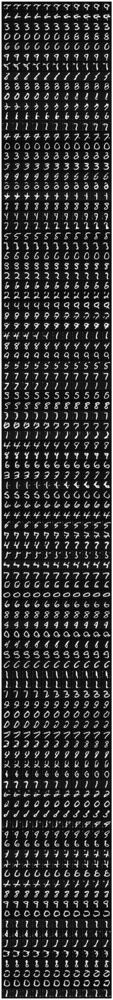

In [310]:
dataset = "MNIST"
gan_type = "dcgan"

model = load_model(dataset, gan_type)
latent_idxs = list(range(100))
linear_interpolation_examples(model, latent_idxs, f"{dataset}_{gan_type}_interp", 11)

# CelebA

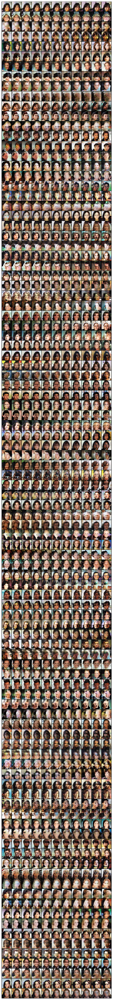

In [311]:
dataset = "CelebA"
gan_type = "dcgan"

model = load_model(dataset, gan_type)
latent_idxs = list(range(100))
linear_interpolation_examples(model, latent_idxs, f"{dataset}_{gan_type}_interp", 11)

# Conditional DCGAN

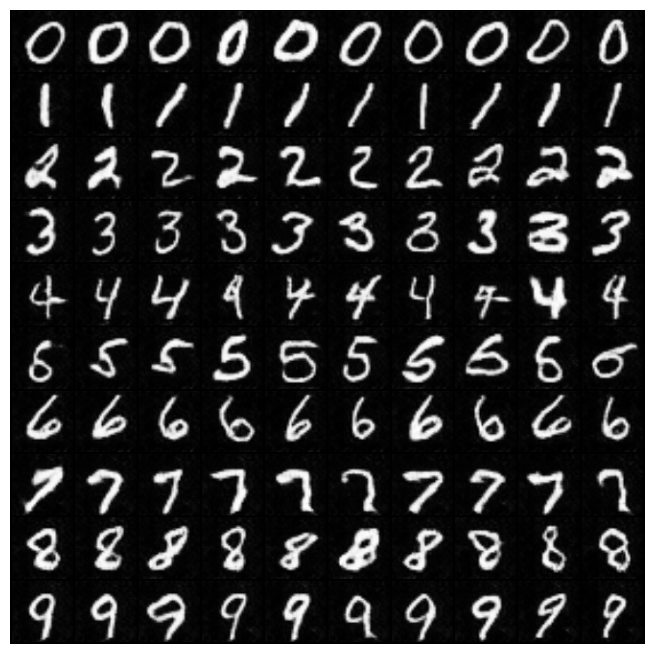

In [312]:
dataset = "MNIST"
gan_type = "conditional_dcgan"

model = load_model(dataset, gan_type)

z = torch.randn(100, LATENT_DIM, device=DEVICE)
labels = torch.arange(0, 10).repeat(10).sort().values.to(DEVICE) 

conditional_imgs = model.generator(z, labels)
plot_images(conditional_imgs, ncol=10, filepath=f"{dataset}_{gan_type}")